# <p style="background-color:#000;font-family:newtimeroman;color:#FF0;font-size:150%;text-align:center;border-radius:50px 50px;">Dentistry<br>Instance Segmentation</p>

In [1]:
!pip install ultralytics
!pip install roboflow

  Obtaining dependency information for ultralytics from https://files.pythonhosted.org/packages/98/44/71231f2da4fb4a602d0cef2071adb708199e571ef89ed4a136f59c19d733/ultralytics-8.0.231-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 663.2/663.2 kB 13.7 MB/s eta 0:00:00a 0:00:01
  Obtaining dependency information for roboflow from https://files.pythonhosted.org/packages/f7/69/530445f36a3435638a7d137a3e60590f2fc68c46260623ca57c108110b4f/roboflow-1.1.14-py3-none-any.whl.metadata
  Obtaining dependency information for certifi==2023.7.22 from https://files.pythonhosted.org/packages/4c/dd/2234eab22353ffc7d94e8d13177aaa050113286e93e7b40eae01fbf7c3d9/certifi-2023.7.22-py3-none-any.whl.metadata
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 3.7 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.6 MB/s eta 0:00:00
  Obtaining dependency information for opencv-python-headless==4.8.0.74 from https://files.pythonhosted.org/package

In [2]:
import os
import ultralytics
import matplotlib.pyplot as plt
from ultralytics import YOLO
from roboflow import Roboflow
from IPython.display import display, Image
from kaggle_secrets import UserSecretsClient

A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3


In [3]:
rf = Roboflow(api_key=UserSecretsClient().get_secret("AhmedNasser1601"))
project = rf.workspace("bassem-ahmed-ouwsa").project("dentistry-vbril")
dataset = project.version(1).download("yolov8", location="/kaggle/working/datasets")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.0.231, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to /kaggle/working/datasets in yolov8:: 100%|██████████| 1139/1139 [00:00<00:00, 8535.35it/s]


# <p style="background-color:#000;font-family:newtimeroman;color:#fff;font-size:120%;text-align:center;border-radius:20px 80px;">Training</p>

In [4]:
ultralytics.checks()

Ultralytics YOLOv8.0.231 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5310.7/8062.4 GB disk)


In [5]:
!yolo task=segment mode=train model=yolov8m-seg.pt data={dataset.location}/data.yaml epochs=100 imgsz=224 batch=32

100%|██████████████████████████████████████| 52.4M/52.4M [00:00<00:00, 81.9MB/s]
Ultralytics YOLOv8.0.231 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
engine/trainer: task=segment, mode=train, model=yolov8m-seg.pt, data=/kaggle/working/datasets/data.yaml, epochs=100, time=None, patience=50, batch=32, imgsz=224, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_tx

# <p style="background-color:#000;font-family:newtimeroman;color:#fff;font-size:120%;text-align:center;border-radius:20px 80px;">Evaluations</p>


[1]===> BoxF1_curve.png


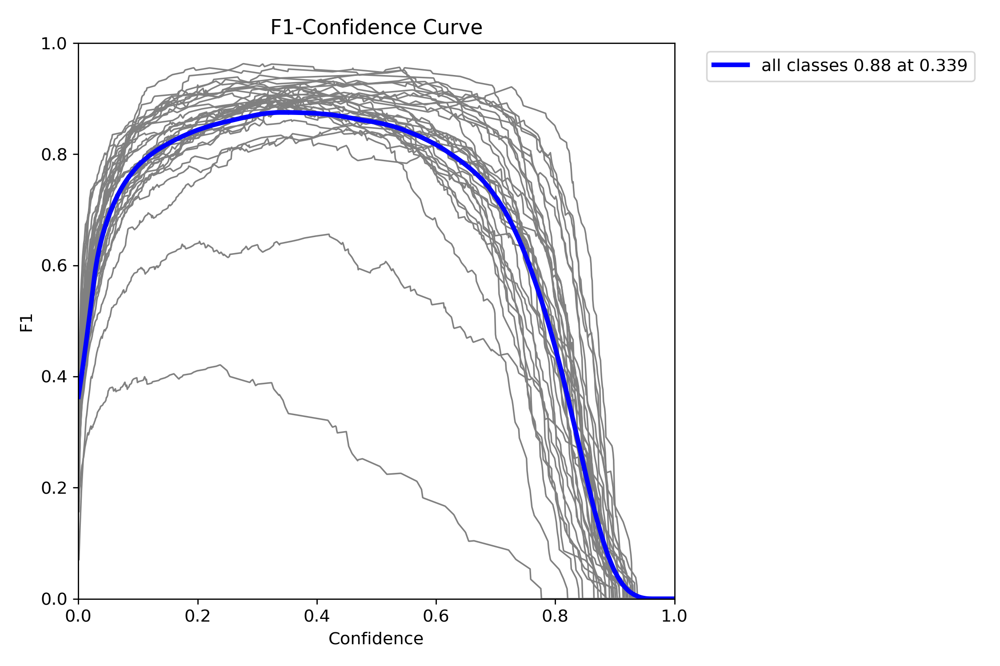


[2]===> BoxPR_curve.png


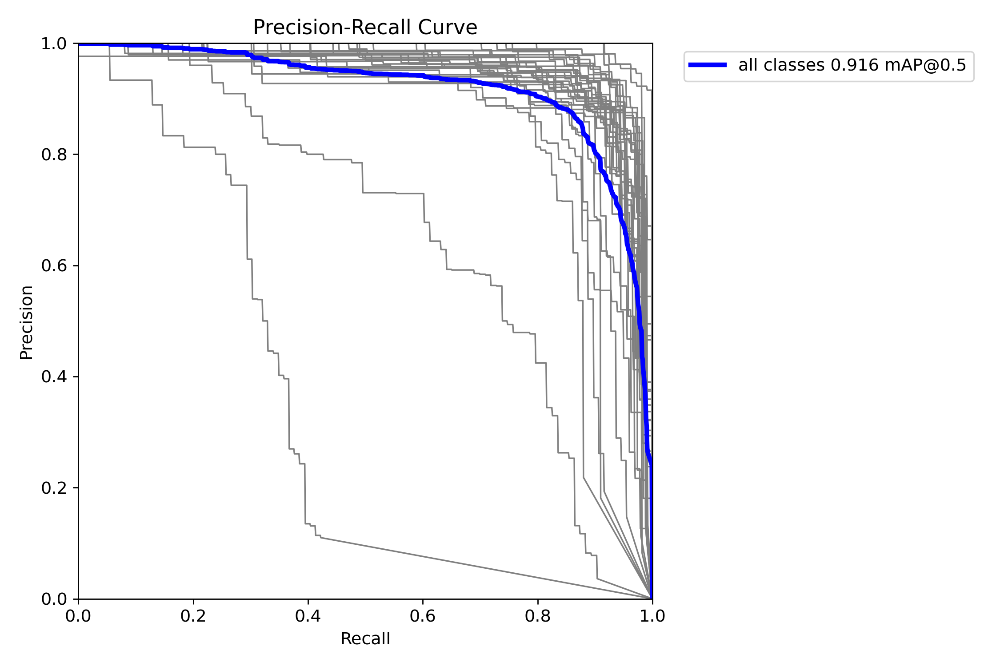


[3]===> BoxP_curve.png


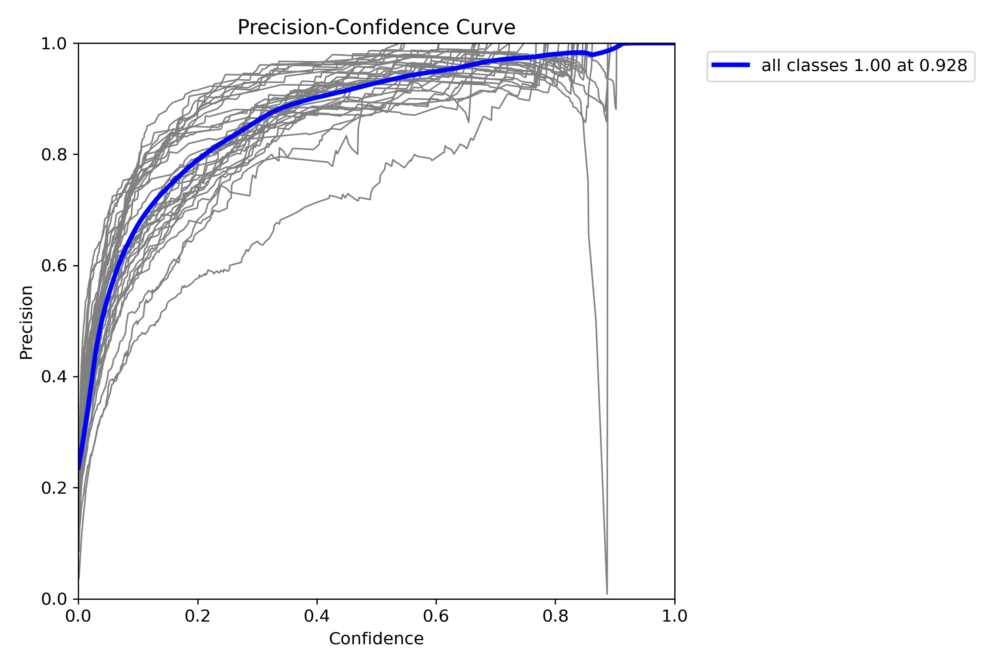


[4]===> BoxR_curve.png


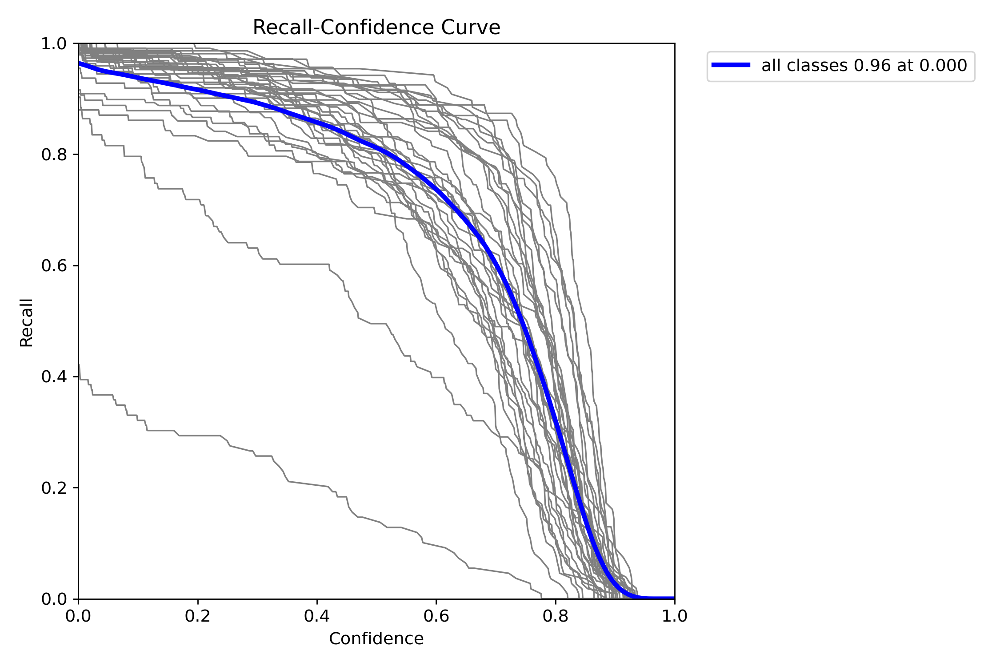


[5]===> MaskF1_curve.png


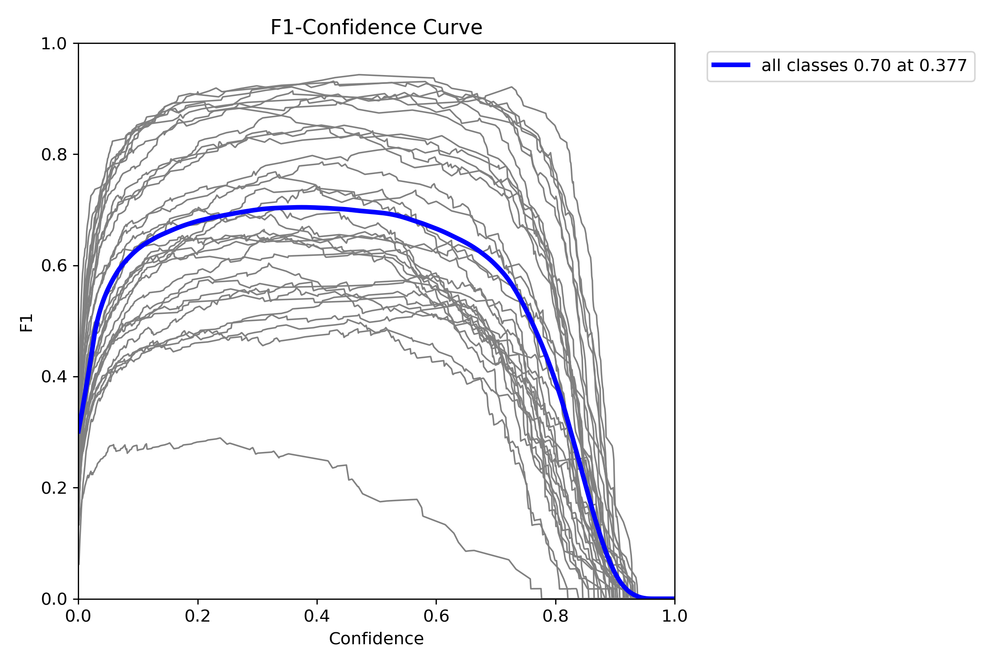


[6]===> MaskPR_curve.png


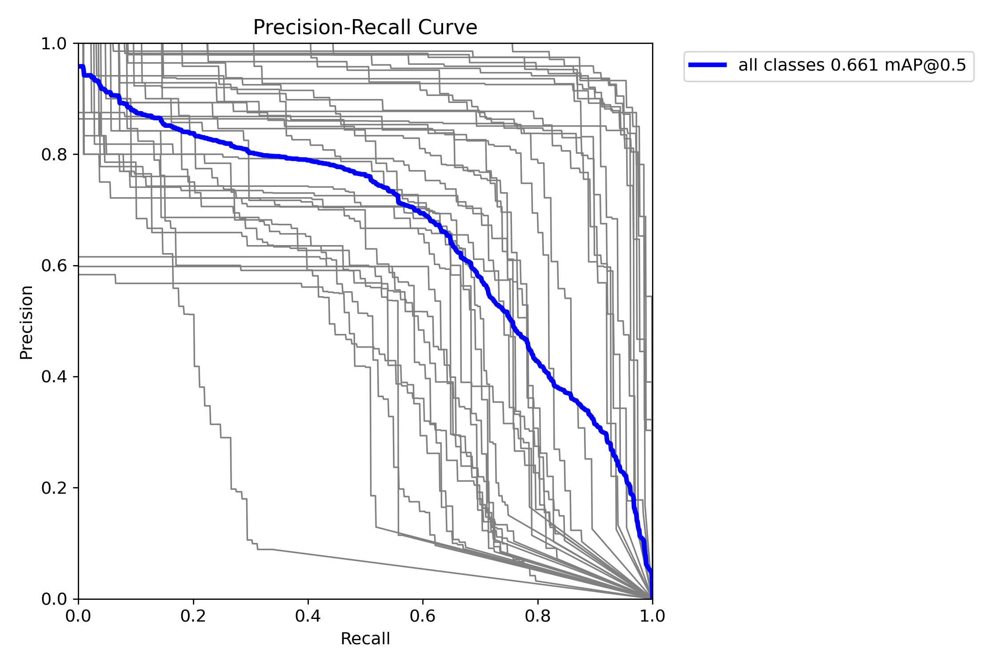


[7]===> MaskP_curve.png


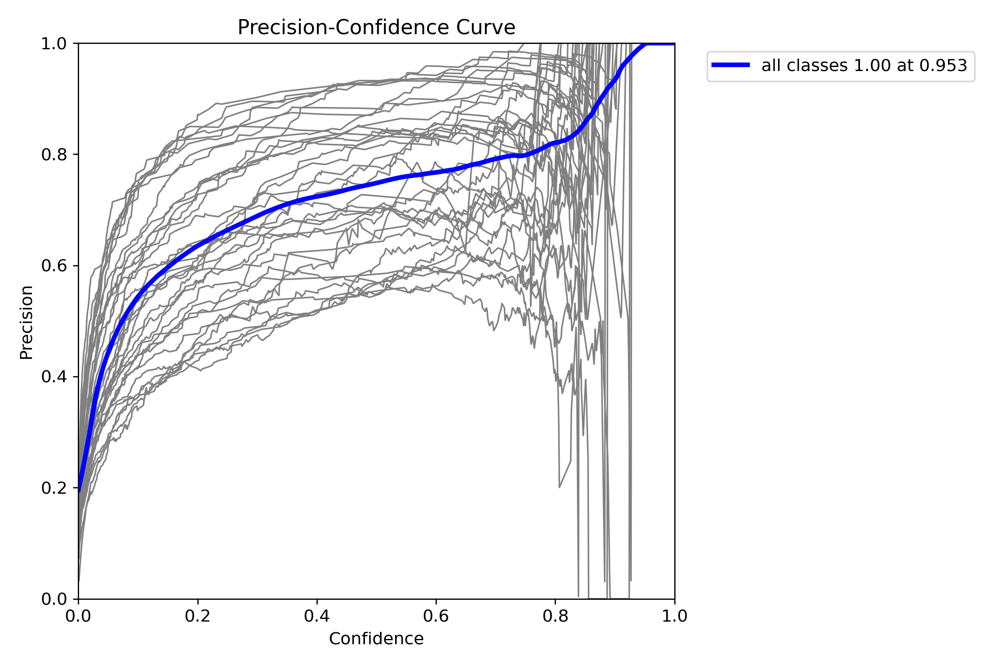


[8]===> MaskR_curve.png


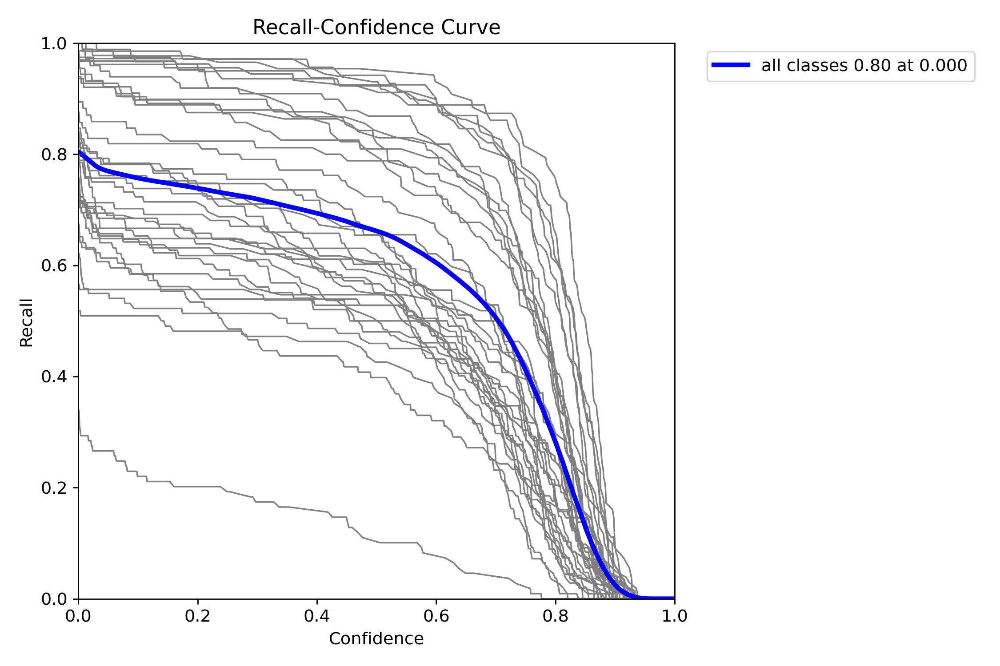


[9]===> confusion_matrix.png


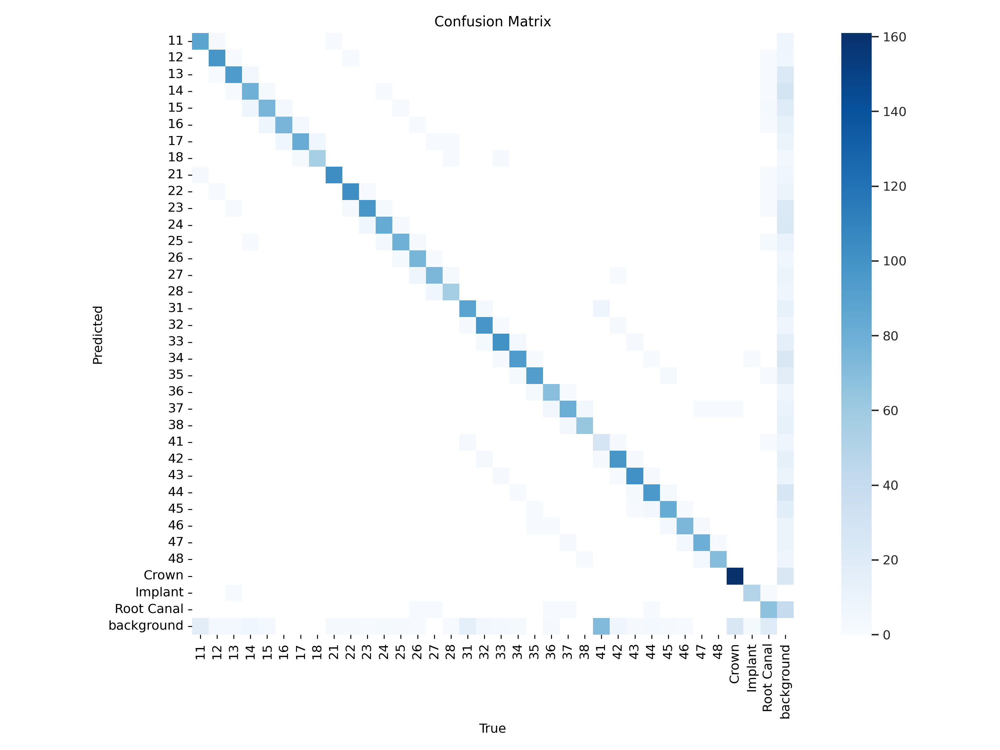


[10]===> confusion_matrix_normalized.png


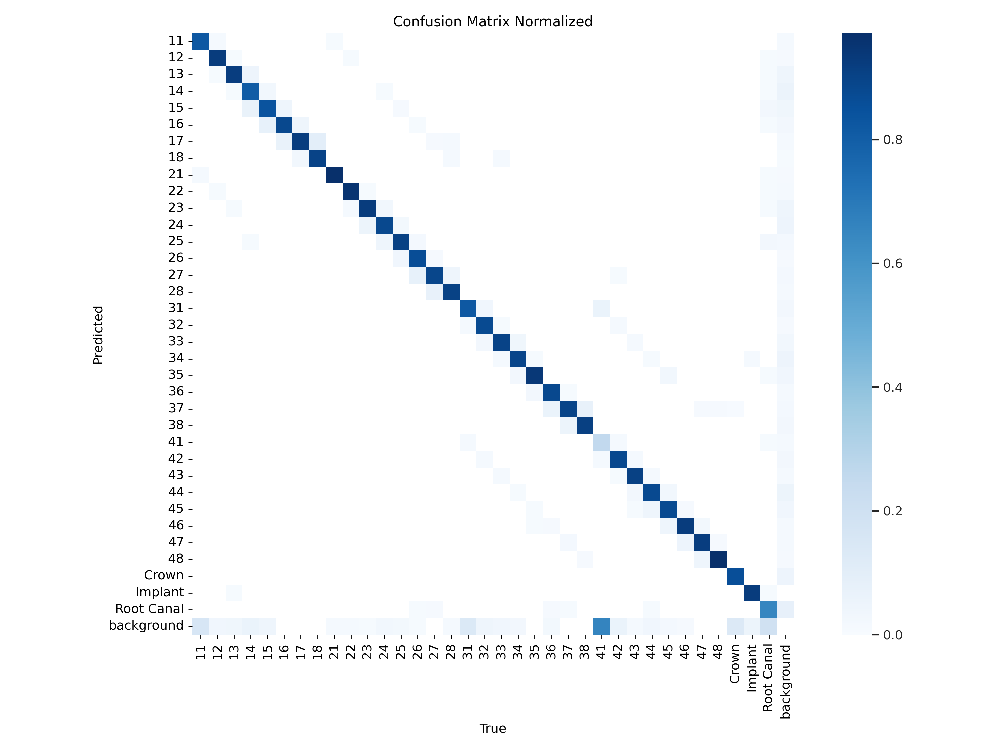


[11]===> labels.jpg


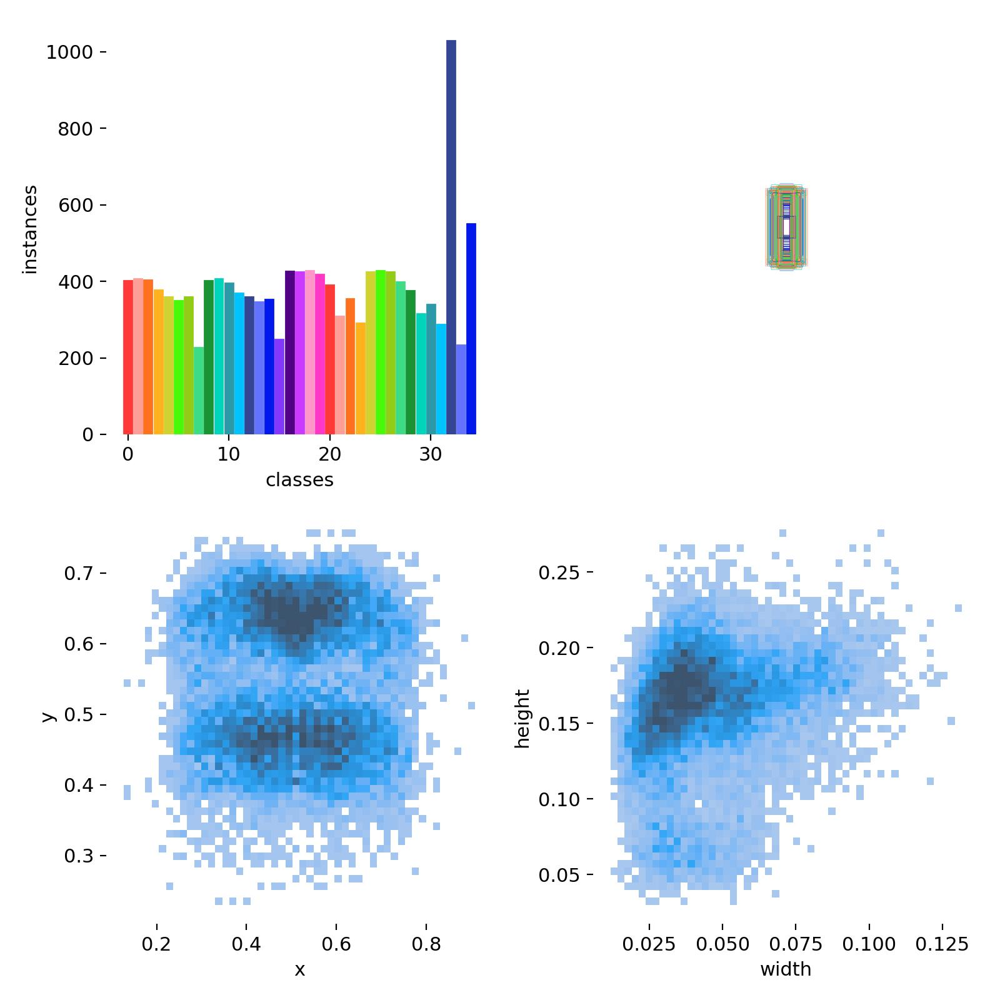


[12]===> labels_correlogram.jpg


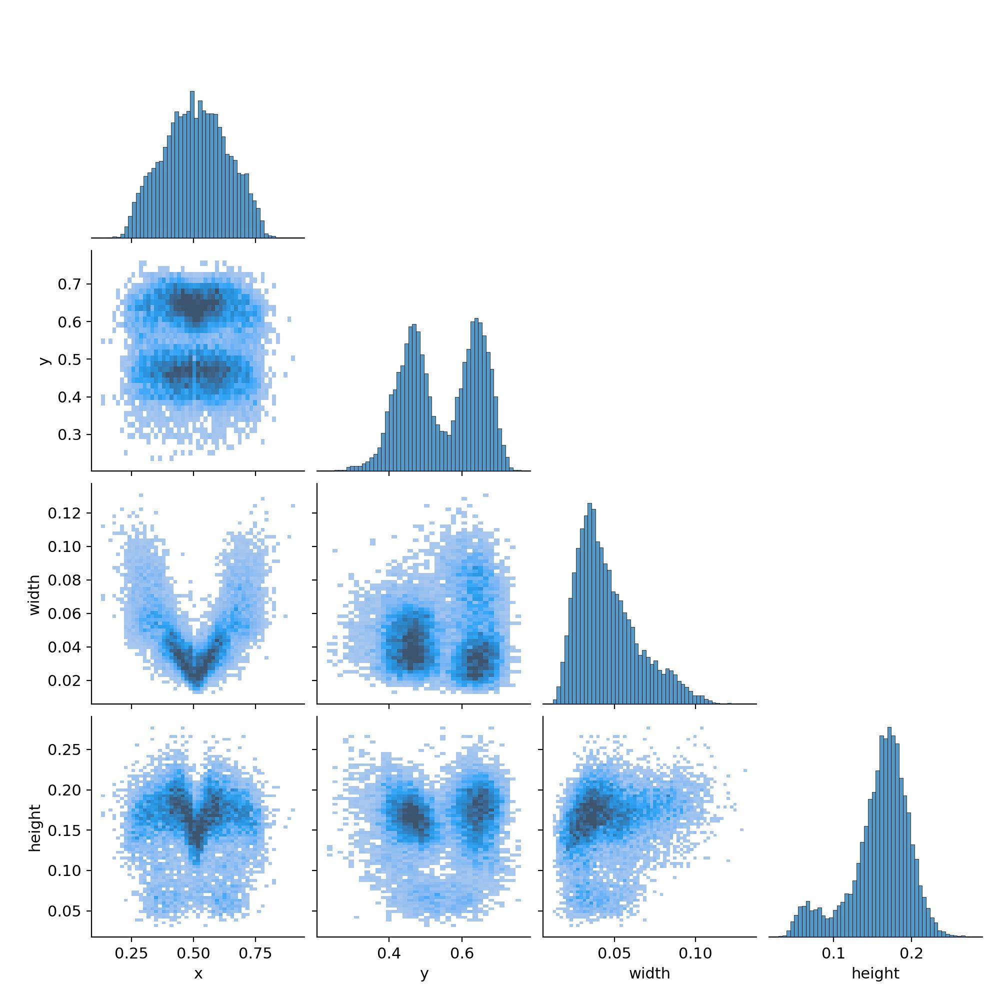


[13]===> results.png


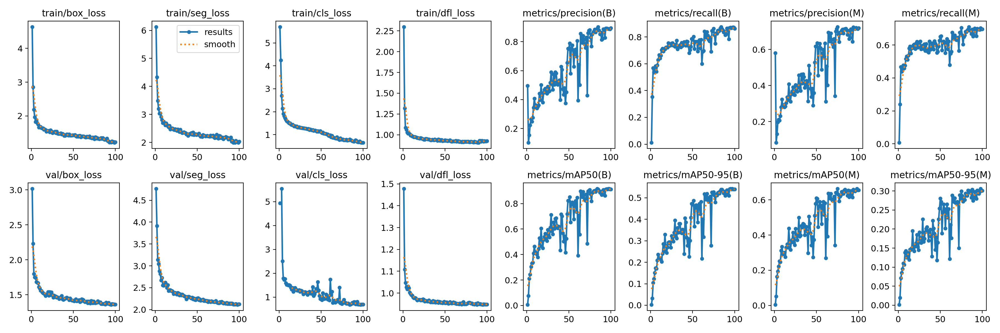


[14]===> train_batch0.jpg


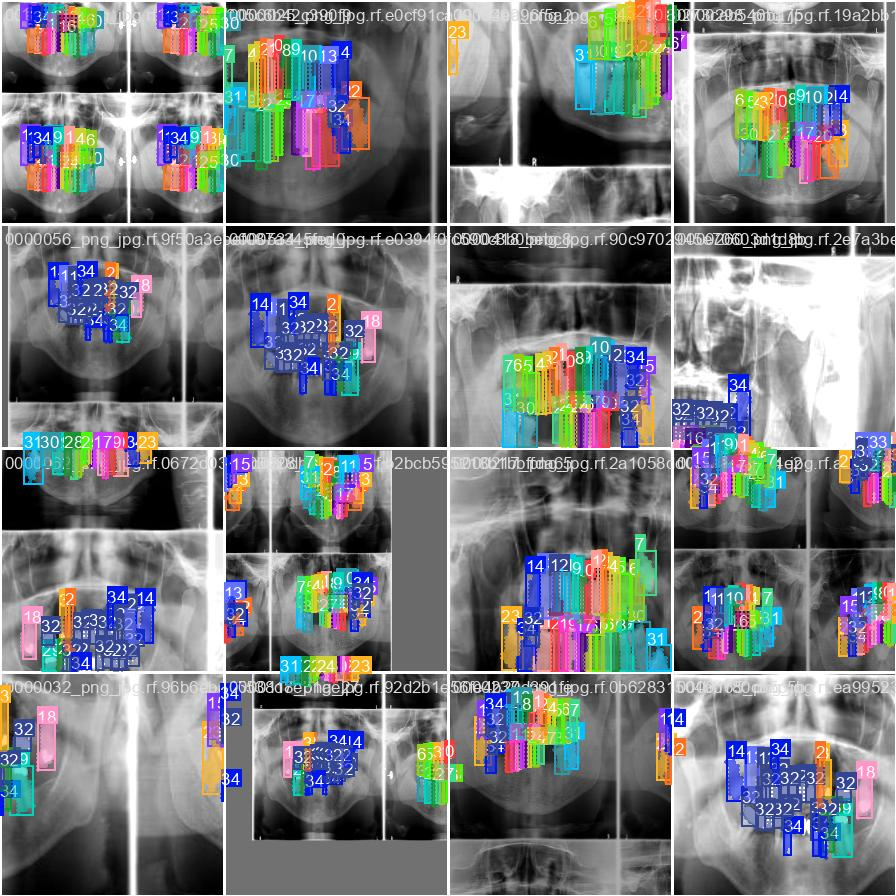


[15]===> train_batch1.jpg


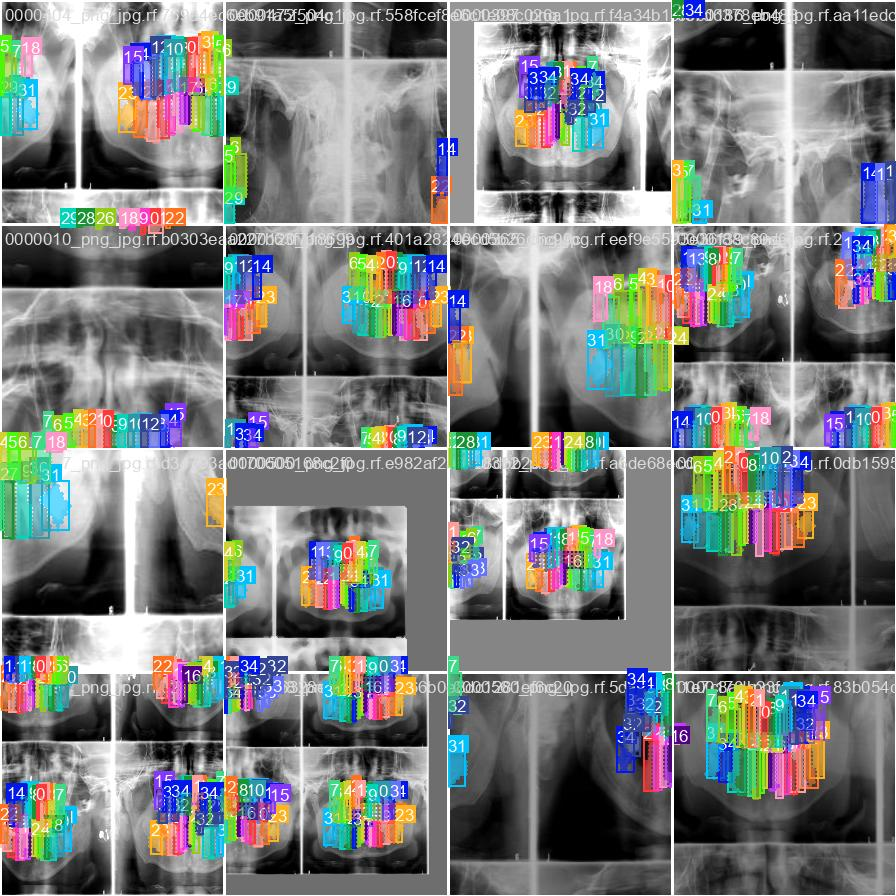


[16]===> train_batch1350.jpg


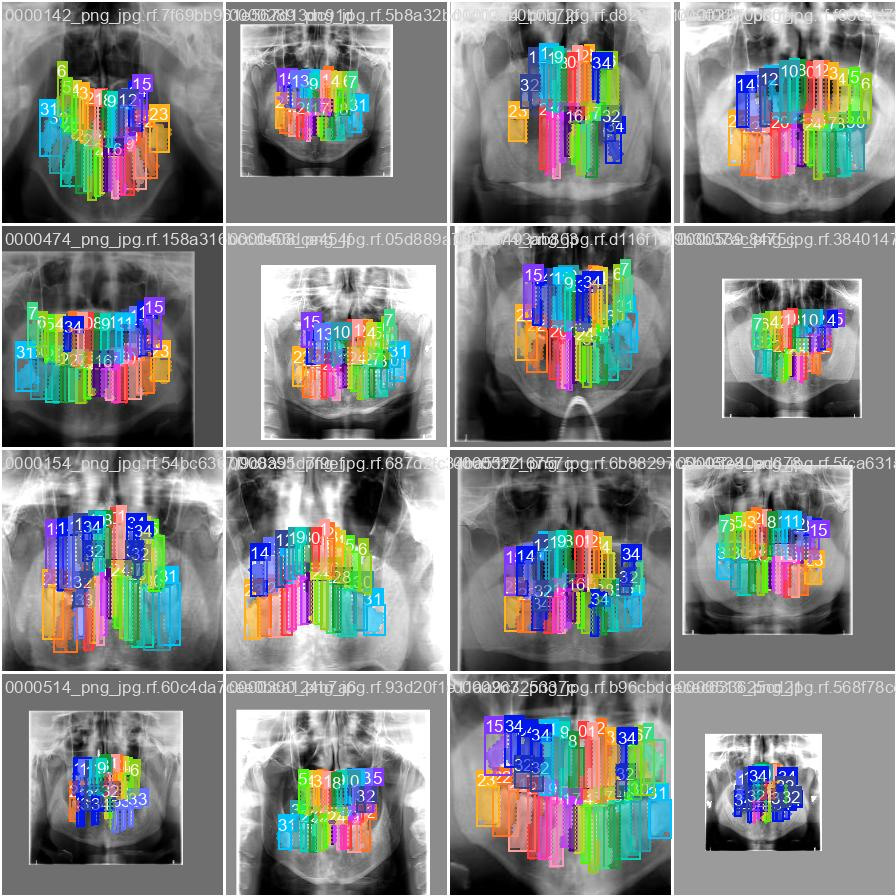


[17]===> train_batch1351.jpg


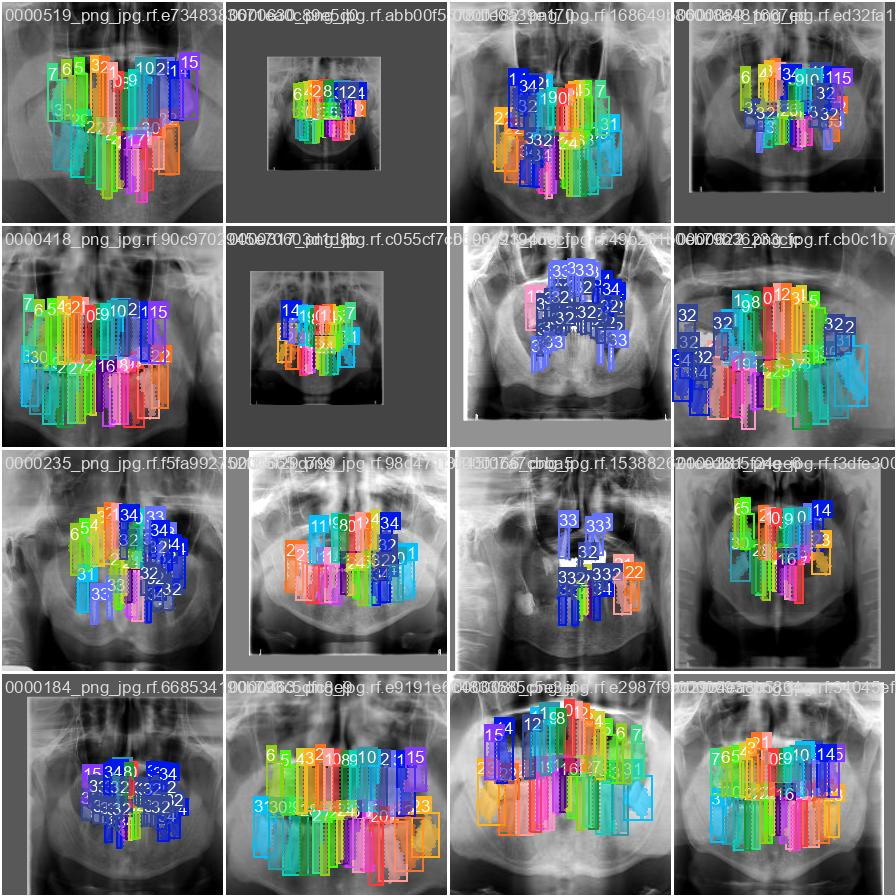


[18]===> train_batch1352.jpg


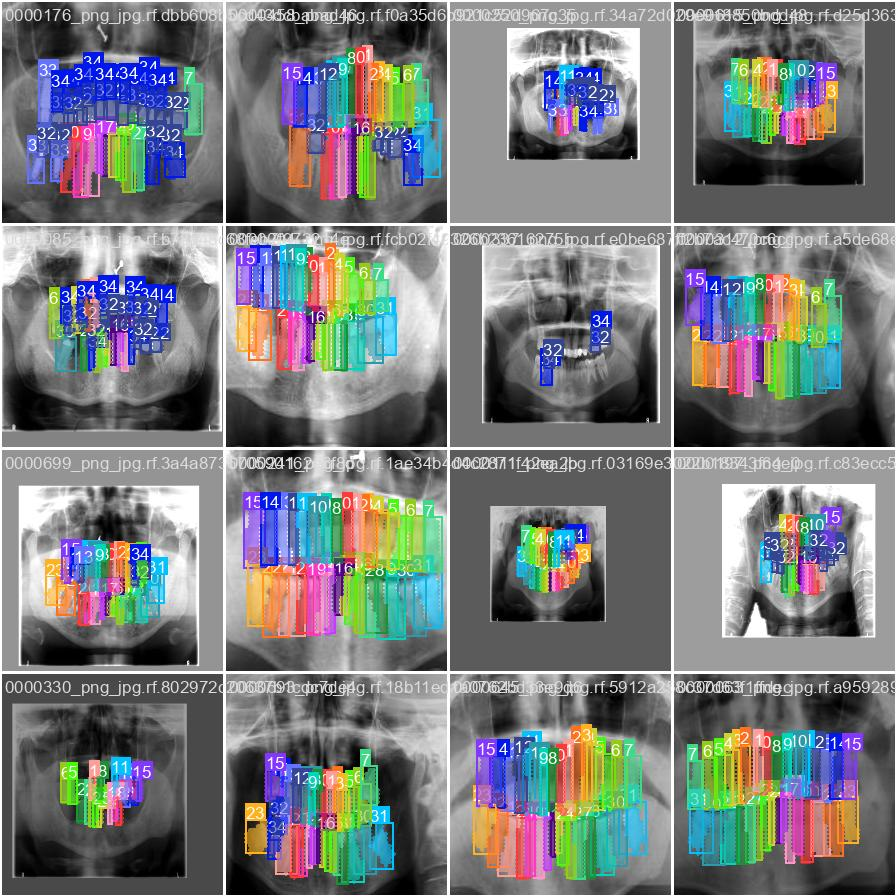


[19]===> train_batch2.jpg


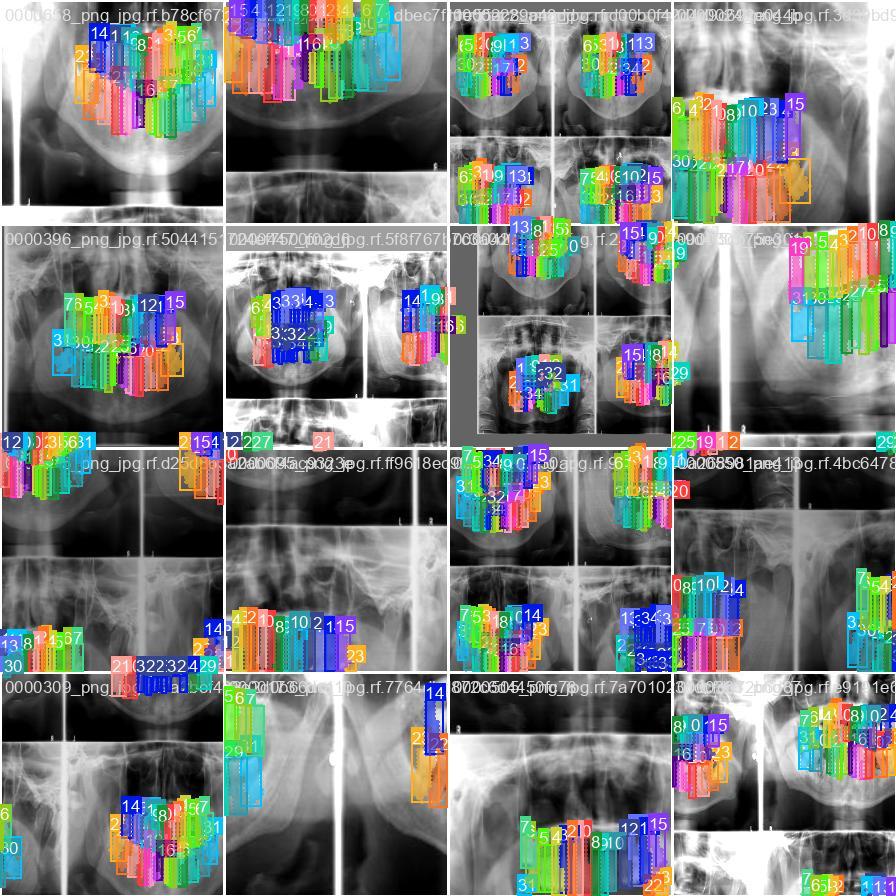


[20]===> val_batch0_labels.jpg


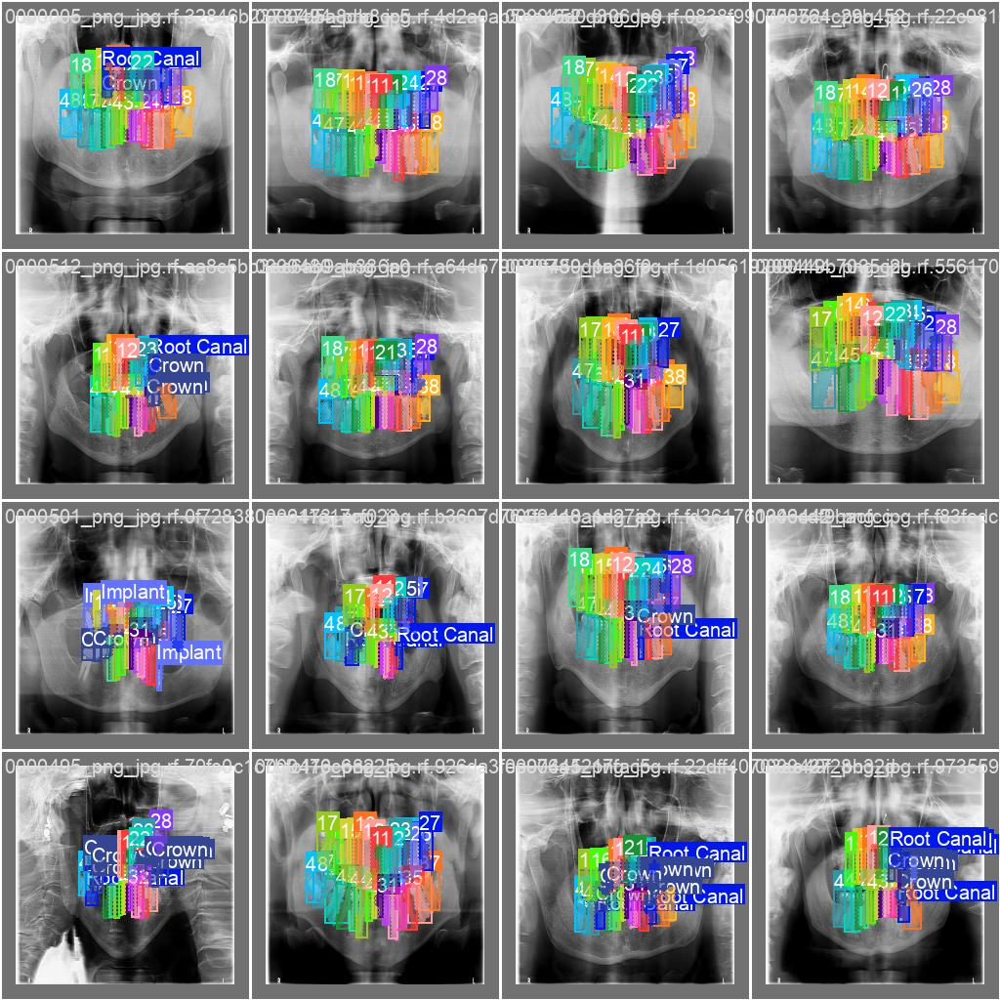


[21]===> val_batch0_pred.jpg


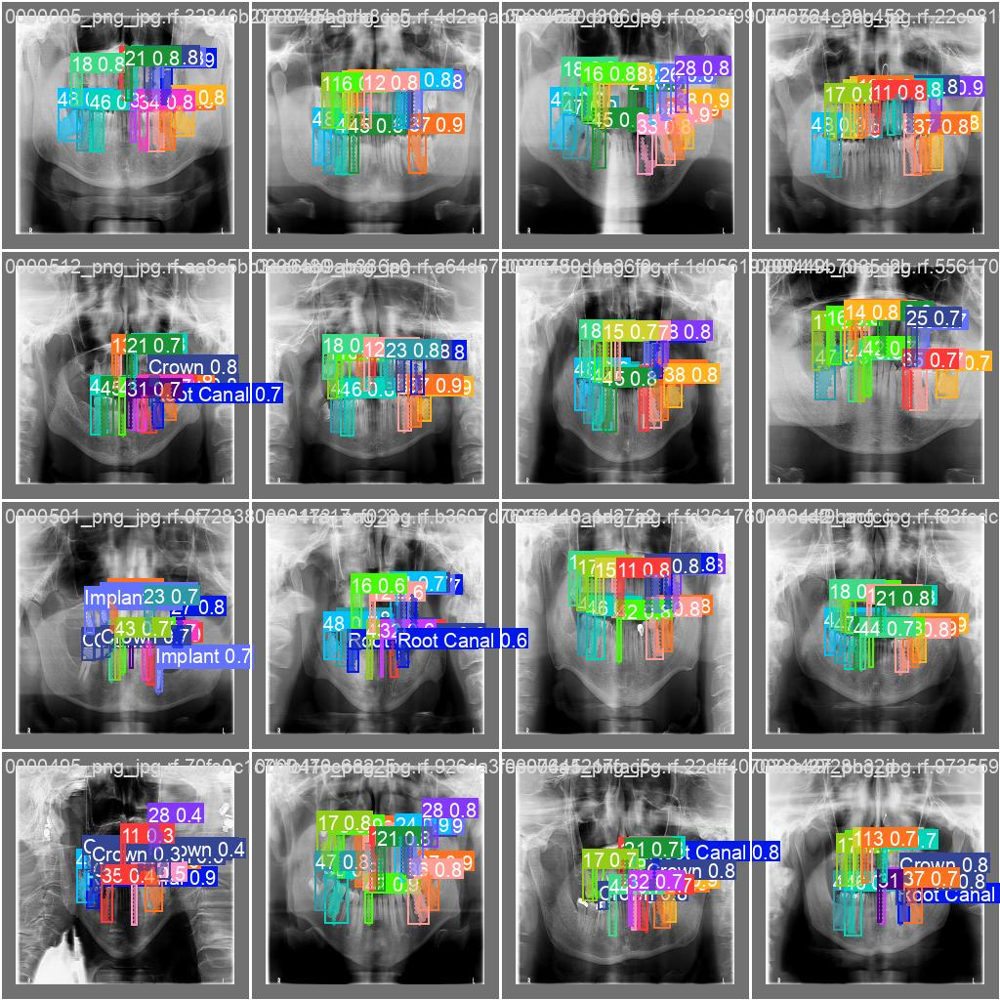


[22]===> val_batch1_labels.jpg


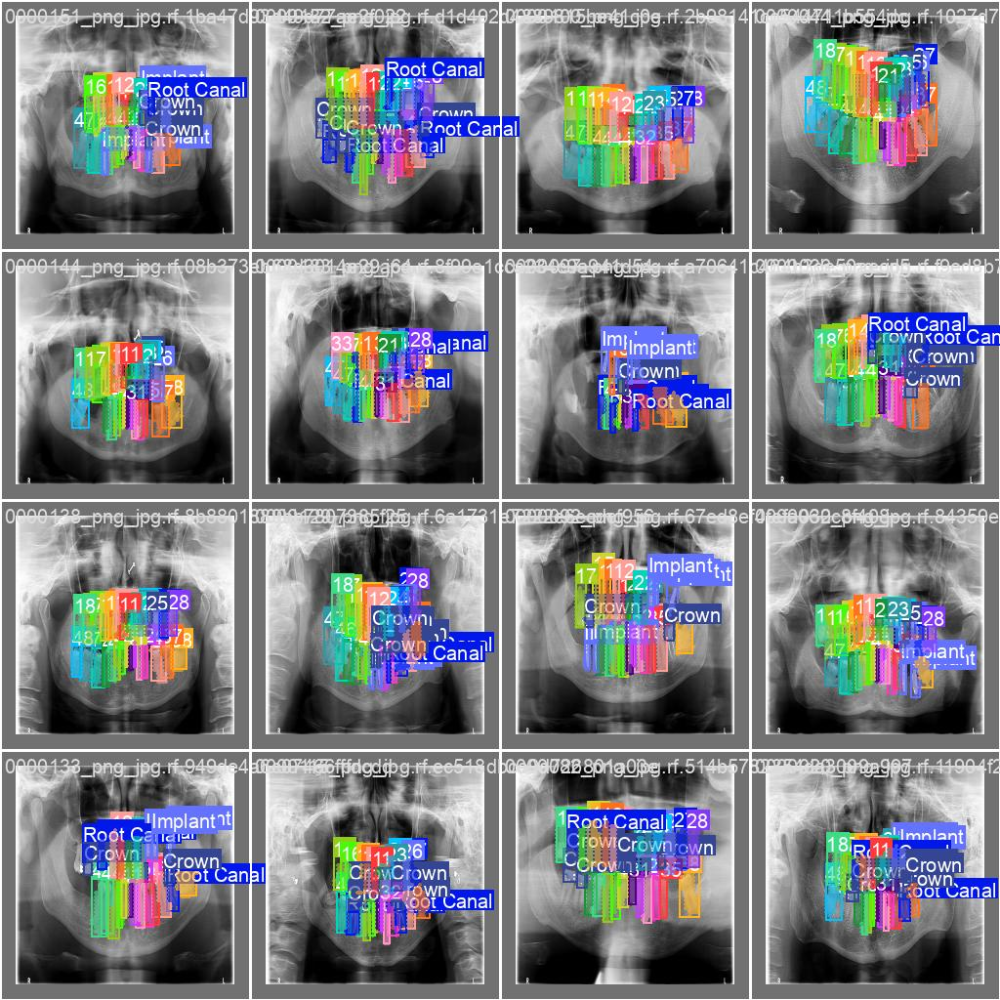


[23]===> val_batch1_pred.jpg


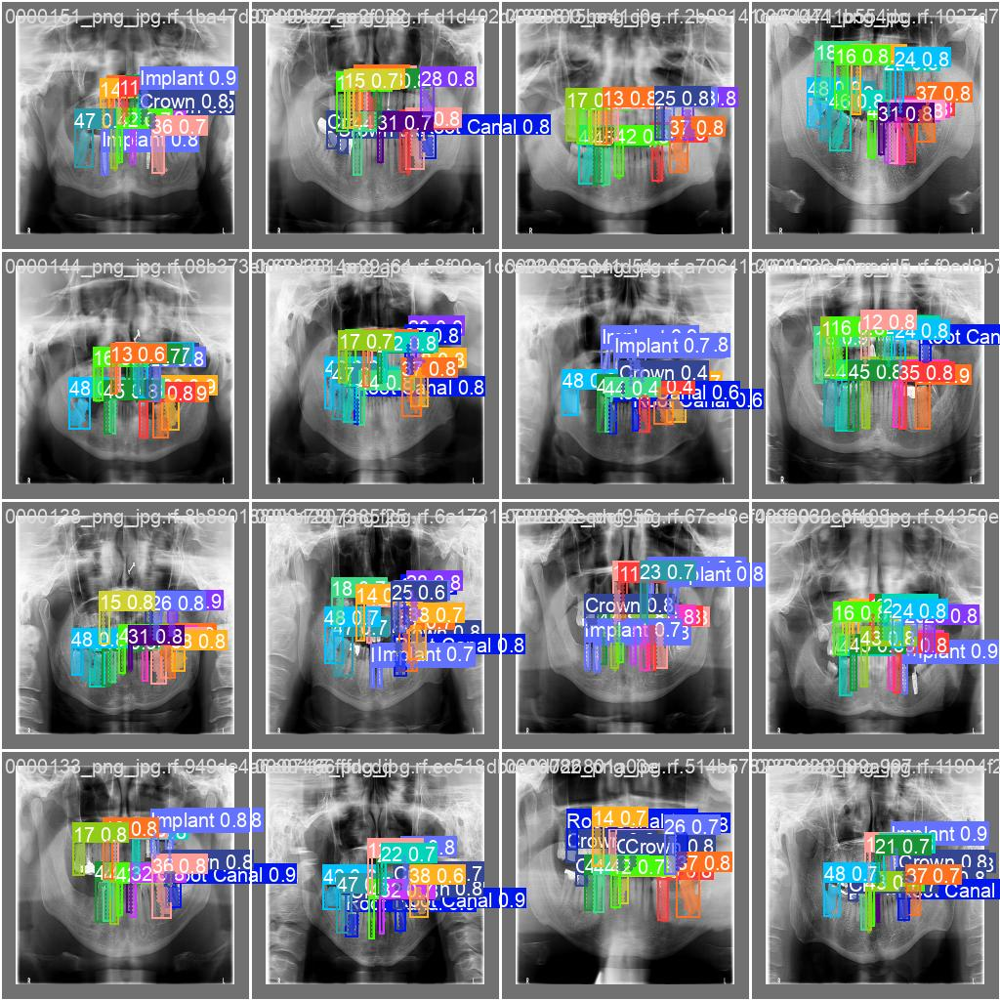

In [6]:
image_dir = '/kaggle/working/runs/segment/train/'
image_files = sorted([f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png'))])

for i, image_file in enumerate(image_files):
    print(f"\n[{i+1}]===> {image_file}")
    display(Image(filename=os.path.join(image_dir, image_file), width=800))

# <p style="background-color:#000;font-family:newtimeroman;color:#fff;font-size:120%;text-align:center;border-radius:20px 80px;">Predictions</p>

In [7]:
!yolo task=segment mode=predict model=/kaggle/working/runs/segment/train/weights/best.pt conf=0.5 source={dataset.location}/valid/images save=True show=True hide_labels=False hide_conf=False save_txt=True save_crop=True

WARNING ⚠️ 'hide_labels' is deprecated and will be removed in 'ultralytics 8.2' in the future. Please use 'show_labels' instead.
WARNING ⚠️ 'hide_conf' is deprecated and will be removed in 'ultralytics 8.2' in the future. Please use 'show_conf' instead.
WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()

Ultralytics YOLOv8.0.231 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
YOLOv8m-seg summary (fused): 245 layers, 27242649 parameters, 0 gradients, 110.1 GFLOPs

image 1/113 /kaggle/working/datasets/valid/images/0000005_png_jpg.rf.32846b23737d5a8db8cc5e959f8f77c6.jpg: 224x224 1 11, 1 12, 1 15, 1 16, 1 18, 1 21, 1 22, 1 23, 1 24, 1 25, 1 26, 1 27, 1 28, 1 31, 1 32, 1 33, 1 34, 1 35, 1 36, 1 37, 1 38, 1 42, 1 45, 1 46, 1 47, 1 48, 8.7ms
image 2/113 /kaggle/working/datasets/valid/images/0000011_png_jpg.rf.41c0b06c5e760d7b71f9e0c7ac0a9683.jpg: 224x224 1 11, 1 12, 1 13, 1 14, 1 15, 1 16, 1 17, 1 18, 1 21, 1 22, 1 23, 1 24, 1 25, 1 26, 1 27, 1 28, 1

# <p style="background-color:#000;font-family:newtimeroman;color:#fff;font-size:120%;text-align:center;border-radius:20px 80px;">Testing</p>

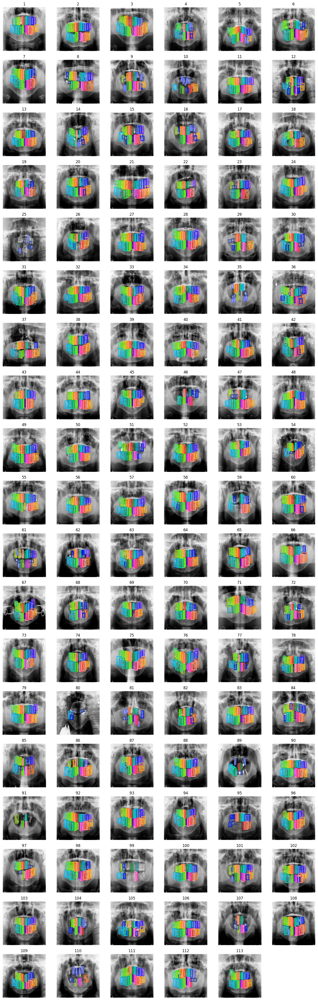

In [8]:
image_dir = '/kaggle/working/runs/segment/predict/'
image_files = sorted([f for f in os.listdir(image_dir) if f.endswith('.jpg')])

num_images = len(image_files)
num_rows = (num_images + 5) // 6
num_cols = min(6, num_images)

fig, axs = plt.subplots(num_rows, 6, figsize=(18, 3 * num_rows))

for i, image_file in enumerate(image_files):
    img = plt.imread(os.path.join(image_dir, image_file))
    axs[i // 6, i % 6].imshow(img)
    axs[i // 6, i % 6].axis('off')
    axs[i // 6, i % 6].set_title(i+1)

for i in range(num_images, num_rows * 6):
    axs[i // 6, i % 6].axis('off')

plt.show()